# Data analysis of CAD dataset from https://github.com/dongpng/cad_naacl2021

In this notebook, we will conduct a data analysis of CAD (The Contextual Abuse Dataset). We will illustrate the main characteristics of this dataset, plot graphs and create functions to extract more information about these Reddit conversations. 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset
import json
import seaborn as sns

## Read the data

I downloaded the dataset from https://github.com/dongpng/cad_naacl. (PS: The cad_v1.tsv and cad_v1_1.tsv files are the same. :)) 

In [2]:
# Read the data contained in cad_v1 file
file_path = "../../data/cad_v1.tsv"

# Read the TSV file into a DataFrame
df_cad_v1 = pd.read_csv(file_path, sep='\t')
df_cad_v1['count'] = 1
df_cad_v1.head()

,id,info_id,info_subreddit,info_subreddit_id,info_id.parent,info_id.link,info_thread.id,info_order,info_image.saved,annotation_Primary,...,annotation_highlighted,meta_author,meta_created_utc,meta_date,meta_day,meta_permalink,split,subreddit_seen,meta_text,count
0,cad_1,alywla-post,Drama,t5_2rd2l,NaN,NaN,2,02-post,0,Neutral,...,NaN,RedGT2033,1548999908,2019-02-01T05:45:08Z,2019-02-01T00:00:00Z,/r/Drama/comments/alywla/centrist_daddy_gets_d...,exclude_empty,1,NaN,1
1,cad_2,am027u-post,conspiracy,t5_2qh4r,NaN,NaN,3,03-post,0,Neutral,...,NaN,G0LD3NDAWN,1549010283,2019-02-01T08:38:03Z,2019-02-01T00:00:00Z,/r/conspiracy/comments/am027u/what_are_your_op...,test,0,. I just watched a 4 hour long disclosure buff...,1
2,cad_3,am80hq-post,subredditcancer,t5_2yv5q,NaN,NaN,5,05-post,0,Neutral,...,NaN,SpecialThrowaway6,1549062528,2019-02-01T23:08:48Z,2019-02-01T00:00:00Z,/r/subredditcancer/comments/am80hq/banned_and_...,exclude_empty,1,NaN,1
3,cad_4,amcs27-post,Drama,t5_2rd2l,NaN,NaN,9,09-post,0,Neutral,...,NaN,[deleted],1549101640,2019-02-02T10:00:40Z,2019-02-02T00:00:00Z,/r/Drama/comments/amcs27/at_rworldnews_10_hour...,exclude_empty,1,NaN,1
4,cad_5,aml76e-post,Drama,t5_2rd2l,NaN,NaN,12,12-post,0,Neutral,...,NaN,KristenLuvsCATS,1549159930,2019-02-03T02:12:10Z,2019-02-03T00:00:00Z,/r/Drama/comments/aml76e/guy_gets_in_trouble_w...,exclude_empty,1,NaN,1


In [7]:
# Read the data contained in cad_v1_1 file
file_path = "../../data/cad_v1_1.tsv"

# Read the TSV file into a DataFrame
df_cad_v1_1 = pd.read_csv(file_path, sep='\t')
df_cad_v1_1['count'] = 1
df_cad_v1_1.head()

,id,info_id,info_subreddit,info_subreddit_id,info_id.parent,info_id.link,info_thread.id,info_order,info_image.saved,annotation_Primary,...,annotation_highlighted,meta_author,meta_created_utc,meta_date,meta_day,meta_permalink,split,subreddit_seen,meta_text,count
0,cad_1,alywla-post,Drama,t5_2rd2l,NaN,NaN,2,02-post,0,Neutral,...,NaN,RedGT2033,1548999908,2019-02-01T05:45:08Z,2019-02-01T00:00:00Z,/r/Drama/comments/alywla/centrist_daddy_gets_d...,exclude_empty,1,NaN,1
1,cad_2,am027u-post,conspiracy,t5_2qh4r,NaN,NaN,3,03-post,0,Neutral,...,NaN,G0LD3NDAWN,1549010283,2019-02-01T08:38:03Z,2019-02-01T00:00:00Z,/r/conspiracy/comments/am027u/what_are_your_op...,test,0,. I just watched a 4 hour long disclosure buff...,1
2,cad_3,am80hq-post,subredditcancer,t5_2yv5q,NaN,NaN,5,05-post,0,Neutral,...,NaN,SpecialThrowaway6,1549062528,2019-02-01T23:08:48Z,2019-02-01T00:00:00Z,/r/subredditcancer/comments/am80hq/banned_and_...,exclude_empty,1,NaN,1
3,cad_4,amcs27-post,Drama,t5_2rd2l,NaN,NaN,9,09-post,0,Neutral,...,NaN,[deleted],1549101640,2019-02-02T10:00:40Z,2019-02-02T00:00:00Z,/r/Drama/comments/amcs27/at_rworldnews_10_hour...,exclude_empty,1,NaN,1
4,cad_5,aml76e-post,Drama,t5_2rd2l,NaN,NaN,12,12-post,0,Neutral,...,NaN,KristenLuvsCATS,1549159930,2019-02-03T02:12:10Z,2019-02-03T00:00:00Z,/r/Drama/comments/aml76e/guy_gets_in_trouble_w...,exclude_empty,1,NaN,1


In [8]:
print(df_cad_v1.columns)
print(df_cad_v1_1.columns)


Index(['id', 'info_id', 'info_subreddit', 'info_subreddit_id',
       'info_id.parent', 'info_id.link', 'info_thread.id', 'info_order',
       'info_image.saved', 'annotation_Primary', 'annotation_Secondary',
       'annotation_Context', 'annotation_Target',
       'annotation_Target_top.level.category', 'annotation_highlighted',
       'meta_author', 'meta_created_utc', 'meta_date', 'meta_day',
       'meta_permalink', 'split', 'subreddit_seen', 'meta_text', 'count'],
      dtype='object')
Index(['id', 'info_id', 'info_subreddit', 'info_subreddit_id',
       'info_id.parent', 'info_id.link', 'info_thread.id', 'info_order',
       'info_image.saved', 'annotation_Primary', 'annotation_Secondary',
       'annotation_Context', 'annotation_Target',
       'annotation_Target_top.level.category', 'annotation_highlighted',
       'meta_author', 'meta_created_utc', 'meta_date', 'meta_day',
       'meta_permalink', 'split', 'subreddit_seen', 'meta_text', 'count'],
      dtype='object')


### Verify split counts

In [9]:
split_counts = df_cad_v1.groupby('split')['count'].sum()
print(split_counts)

split
dev               4684
exclude_bot        604
exclude_empty     2244
exclude_image        1
exclude_lang       353
test              5495
train            14113
Name: count, dtype: int64


In [10]:
split_counts = df_cad_v1_1.groupby('split')['count'].sum()
print(split_counts)

split
dev               4684
exclude_bot        604
exclude_empty     2244
exclude_image        1
exclude_lang       353
test              5495
train            14113
Name: count, dtype: int64


In [11]:
len(df_cad_v1_1['id'].unique())

27494

### Labels 

In [12]:
label_counts = df_cad_v1_1.groupby('annotation_Primary')['count'].sum() 
print(label_counts)

annotation_Primary
AffiliationDirectedAbuse     1349
CounterSpeech                 220
IdentityDirectedAbuse        2729
Neutral                     21935
PersonDirectedAbuse          1112
Slur                          149
Name: count, dtype: int64


In [13]:
df_cad_v1_1['label'] = df_cad_v1_1['annotation_Primary'].isin(["AffiliationDirectedAbuse", "IdentityDirectedAbuse", "PersonDirectedAbuse"]).astype(int)

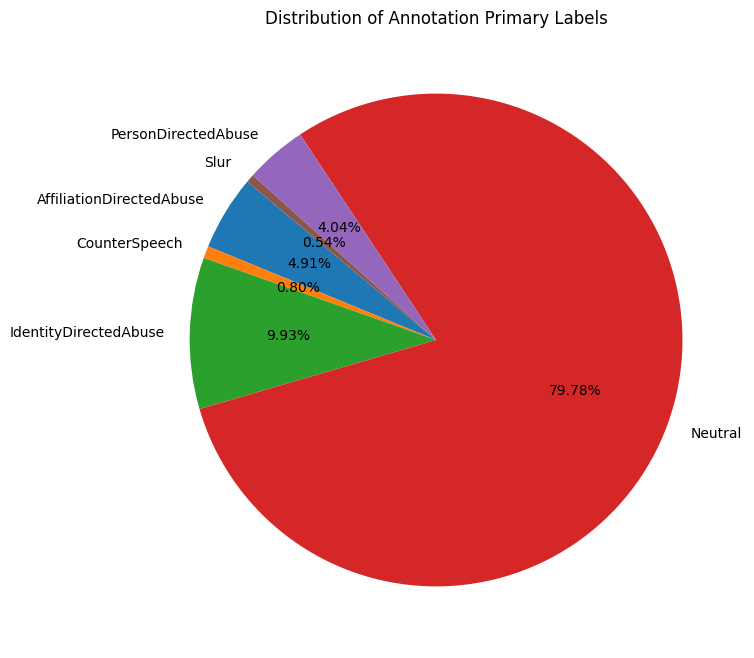

In [14]:
# Plotting the pie chart
plt.figure(figsize=(8, 8))
plt.pie(label_counts, labels=label_counts.index, autopct='%1.2f%%', startangle=140)
plt.title('Distribution of Annotation Primary Labels')
plt.show()

In [15]:
total = len(df_cad_v1_1)

### Subreddits

In [16]:
subreddits_cad = df_cad_v1_1.groupby('info_subreddit')['count'].sum()
print(subreddits_cad)

info_subreddit
4chan                    1168
CCJ2                      706
Drama                    3986
HateCrimeHoaxes           469
ImGoingToHellForThis     1251
Negareddit                807
ShitPoliticsSays         2576
SubredditDrama           3222
TrueOffMyChest           1107
TumblrInAction           4683
WatchRedditDie           1199
bakchodi                 1486
conspiracy               2600
imgoingtohellforthis2     167
smuggies                  742
subredditcancer          1325
Name: count, dtype: int64


In [17]:
subreddits_percent_cad = df_cad_v1_1.groupby('info_subreddit')['count'].sum() * 100 / total 
print(subreddits_percent_cad)

info_subreddit
4chan                     4.248200
CCJ2                      2.567833
Drama                    14.497709
HateCrimeHoaxes           1.705827
ImGoingToHellForThis      4.550084
Negareddit                2.935186
ShitPoliticsSays          9.369317
SubredditDrama           11.718920
TrueOffMyChest            4.026333
TumblrInAction           17.032807
WatchRedditDie            4.360951
bakchodi                  5.404816
conspiracy                9.456609
imgoingtohellforthis2     0.607405
smuggies                  2.698771
subredditcancer           4.819233
Name: count, dtype: float64


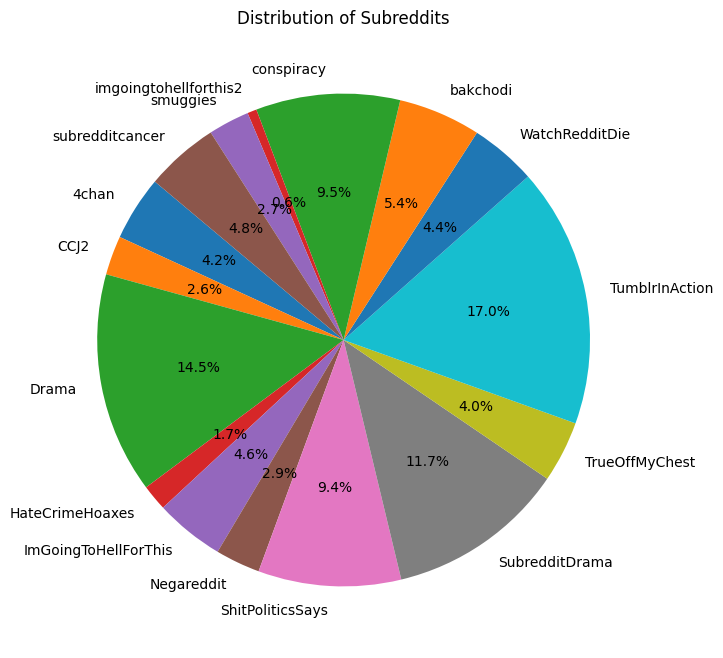

In [18]:
# Plotting the pie chart
plt.rcParams['text.usetex'] = False

plt.figure(figsize=(8, 8))
plt.pie(subreddits_cad, labels=subreddits_cad.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Subreddits')

plt.show()

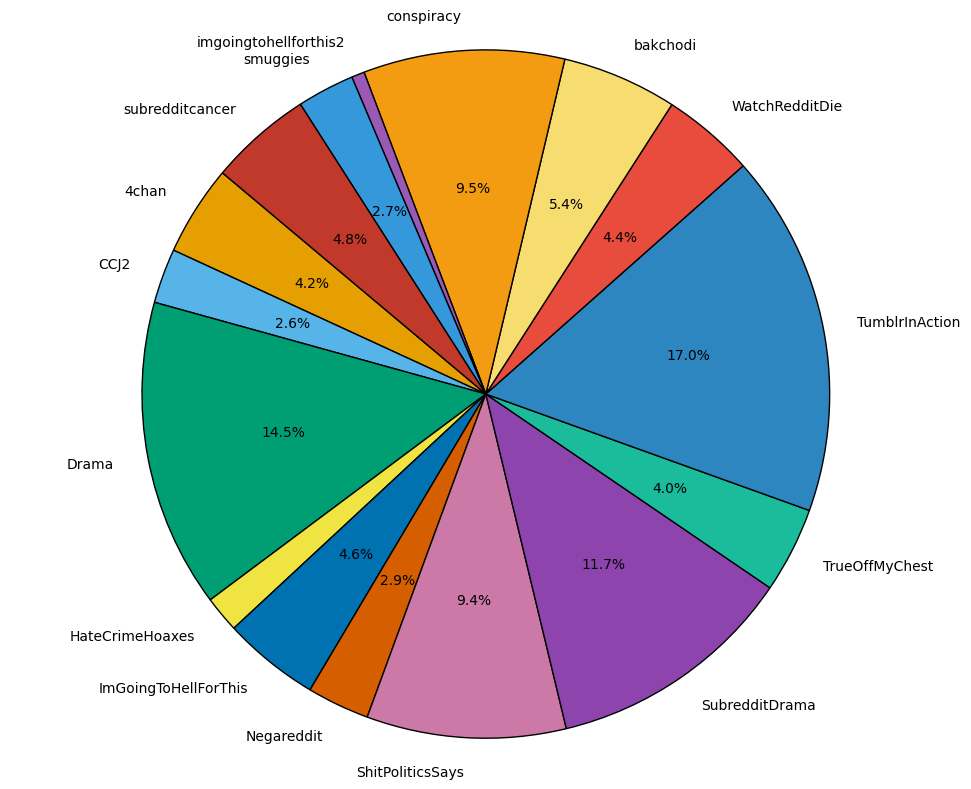

In [19]:
import matplotlib.pyplot as plt

# Colors: Colorblind-friendly palette
colors = [
    '#E69F00', '#56B4E9', '#009E73', '#F0E442', '#0072B2',
    '#D55E00', '#CC79A7', '#8E44AD', '#1ABC9C', '#2E86C1',
    '#E74C3C', '#F7DC6F', '#F39C12', '#9B59B6', '#3498DB', '#C0392B'
]

# Custom function to display percentages only if they are greater than 1%
def autopct_format(pct):
    return f'{pct:.1f}%' if pct > 2 else ''

# Create the pie chart
plt.figure(figsize=(10, 8))
wedges, texts, autotexts = plt.pie(
    subreddits_cad, 
    labels=subreddits_cad.index,
    autopct=autopct_format, 
    startangle=140, 
    colors=colors, 
    wedgeprops={'edgecolor': 'black'},  # Adds a border for better visual separation
    textprops={'fontsize': 10, 'color': 'black'}  # Font size for labels
)

# Customize the plot title and layout
plt.axis('equal')  # Ensure the pie chart is circular

# Improve the layout
plt.tight_layout()

# Show the plot
plt.show()

### Users

In [20]:
users_cad = df_cad_v1_1.groupby('meta_author')['count'].sum()
print(users_cad)

meta_author
--Edog--              4
--shaunoftheliving    1
-BTFraggerCS-         1
-DISNEY-              1
-Daetrax-             1
                     ..
zune13                1
zuudo                 1
zwiebelsaft           1
zwind                 1
zyklorpthehuman       2
Name: count, Length: 11123, dtype: int64


### Context

In [21]:
annotContext_cad = df_cad_v1_1.groupby('annotation_Context')['count'].sum()
print(annotContext_cad)

annotation_Context
CurrentContent     3993
PreviousContent    1566
Name: count, dtype: int64


### Date

In [22]:
day_cad = df_cad_v1_1.groupby('meta_day')['count'].sum()
print(day_cad)	

meta_day
2019-02-01T00:00:00Z     35
2019-02-02T00:00:00Z    157
2019-02-03T00:00:00Z    136
2019-02-04T00:00:00Z    166
2019-02-05T00:00:00Z    323
                       ... 
2020-06-30T00:00:00Z      3
2020-07-02T00:00:00Z      1
2020-07-05T00:00:00Z     10
2020-07-06T00:00:00Z      2
2020-07-15T00:00:00Z      1
Name: count, Length: 248, dtype: int64


## Extract ids and match against all subreddit content

In [23]:
df_cad_v1_1['id'] = df_cad_v1_1["info_id"].apply(lambda x: x.split('-')[0]) 	
df_cad_v1_1['id_type'] = df_cad_v1_1["info_id"].apply(lambda x: x.split('-')[1] if len(x.split('-')) > 1 else '')	

In [24]:
df_cad_v1_1.head()

,id,info_id,info_subreddit,info_subreddit_id,info_id.parent,info_id.link,info_thread.id,info_order,info_image.saved,annotation_Primary,...,meta_created_utc,meta_date,meta_day,meta_permalink,split,subreddit_seen,meta_text,count,label,id_type
0,alywla,alywla-post,Drama,t5_2rd2l,NaN,NaN,2,02-post,0,Neutral,...,1548999908,2019-02-01T05:45:08Z,2019-02-01T00:00:00Z,/r/Drama/comments/alywla/centrist_daddy_gets_d...,exclude_empty,1,NaN,1,0,post
1,am027u,am027u-post,conspiracy,t5_2qh4r,NaN,NaN,3,03-post,0,Neutral,...,1549010283,2019-02-01T08:38:03Z,2019-02-01T00:00:00Z,/r/conspiracy/comments/am027u/what_are_your_op...,test,0,. I just watched a 4 hour long disclosure buff...,1,0,post
2,am80hq,am80hq-post,subredditcancer,t5_2yv5q,NaN,NaN,5,05-post,0,Neutral,...,1549062528,2019-02-01T23:08:48Z,2019-02-01T00:00:00Z,/r/subredditcancer/comments/am80hq/banned_and_...,exclude_empty,1,NaN,1,0,post
3,amcs27,amcs27-post,Drama,t5_2rd2l,NaN,NaN,9,09-post,0,Neutral,...,1549101640,2019-02-02T10:00:40Z,2019-02-02T00:00:00Z,/r/Drama/comments/amcs27/at_rworldnews_10_hour...,exclude_empty,1,NaN,1,0,post
4,aml76e,aml76e-post,Drama,t5_2rd2l,NaN,NaN,12,12-post,0,Neutral,...,1549159930,2019-02-03T02:12:10Z,2019-02-03T00:00:00Z,/r/Drama/comments/aml76e/guy_gets_in_trouble_w...,exclude_empty,1,NaN,1,0,post


In [25]:
df_cad_v1_1["meta_text"] = "" if df_cad_v1_1["meta_text"]

SyntaxError: invalid syntax (3398732504.py, line 1)

In [26]:

df_cad_v1_1["length_text"] = df_cad_v1_1["meta_text"].apply(lambda x: len(x) if isinstance(x, str) else 0)



In [27]:
df_cad_final = ""

In [28]:
# CAD Dataframe, define the CAD dataframe that contains only train/dev and test splits
# I also modify few things in the dataframe to utilize it in the process_file code down the line
# This dataframe will be used to construct to check if a post or comment belong to CAD.

df_cad_final = df_cad_v1_1[df_cad_v1_1["split"].isin(["train", "test", "dev"])].copy()
df_cad_final["label"] = df_cad_final["annotation_Primary"]
df_cad_final.set_index('id', inplace=True)

In [29]:
df_cad_final

,info_id,info_subreddit,info_subreddit_id,info_id.parent,info_id.link,info_thread.id,info_order,info_image.saved,annotation_Primary,annotation_Secondary,...,meta_date,meta_day,meta_permalink,split,subreddit_seen,meta_text,count,label,id_type,length_text
id,,,,,,,,,,,,,,,,,,,,,
am027u,am027u-post,conspiracy,t5_2qh4r,NaN,NaN,3,03-post,0,Neutral,NaN,...,2019-02-01T08:38:03Z,2019-02-01T00:00:00Z,/r/conspiracy/comments/am027u/what_are_your_op...,test,0,. I just watched a 4 hour long disclosure buff...,1,Neutral,post,1692
an4gkh,an4gkh-post,TrueOffMyChest,t5_2yuqy,NaN,NaN,26,26-post,0,Neutral,NaN,...,2019-02-04T18:14:46Z,2019-02-04T00:00:00Z,/r/TrueOffMyChest/comments/an4gkh/just_got_lai...,train,1,I just got laid off. I don't even know what to...,1,Neutral,post,780
an8e3n,an8e3n-post,conspiracy,t5_2qh4r,NaN,NaN,33,33-post,0,Neutral,NaN,...,2019-02-05T00:31:07Z,2019-02-05T00:00:00Z,/r/conspiracy/comments/an8e3n/what_is_being_pl...,test,0,Security has been ever increasing on the south...,1,Neutral,post,1059
anmla4,anmla4-post,TrueOffMyChest,t5_2yuqy,NaN,NaN,37,37-post,0,Neutral,NaN,...,2019-02-06T03:44:23Z,2019-02-06T00:00:00Z,/r/TrueOffMyChest/comments/anmla4/my_best_frie...,train,1,"My best friend, who I grew up with and had a H...",1,Neutral,post,3499
aobe00,aobe00-post,TrueOffMyChest,t5_2yuqy,NaN,NaN,49,49-post,0,Neutral,NaN,...,2019-02-08T01:43:05Z,2019-02-08T00:00:00Z,/r/TrueOffMyChest/comments/aobe00/i_find_suici...,train,1,Today wasn't terrible. I suppose that would h...,1,Neutral,post,2031
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
byw36e,byw36e-title,CCJ2,t5_32cg1,NaN,NaN,1113,1113-title,0,IdentityDirectedAbuse,IdentityDirectedAbuse / animosity,...,2020-06-10T00:01:15Z,2020-06-10T00:00:00Z,/r/CCJ2/comments/byw36e/drinking_too_much_hot_...,test,0,Drinking too much hot water from your Rainies?,1,IdentityDirectedAbuse,title,46
au160j,au160j-title,ImGoingToHellForThis,t5_2s7yq,NaN,NaN,210,210-title,imageNotSaved,IdentityDirectedAbuse,IdentityDirectedAbuse / derogation,...,2020-02-23T00:01:15Z,2020-02-23T00:00:00Z,/r/ImGoingToHellForThis/comments/au160j/night_...,dev,0,Night ninjas,1,IdentityDirectedAbuse,title,12
b63iy8,b63iy8-title,conspiracy,t5_2qh4r,NaN,NaN,499,499-title,0,Neutral,NaN,...,2020-03-27T00:01:15Z,2020-03-27T00:00:00Z,/r/conspiracy/comments/b63iy8/the_decline_of_e...,test,0,The Decline of Euro/American Males and The Ris...,1,Neutral,title,96


In [30]:
id_array = df_cad_final.index.values.tolist()

## Comment Length 

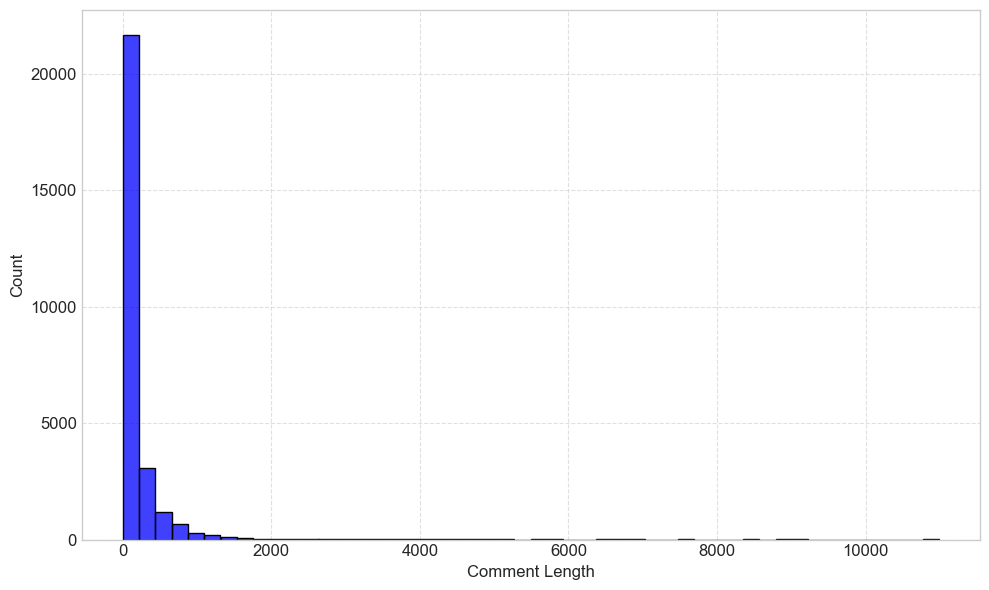

In [82]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Sample Data Preparation (Replace this with your actual dataset)
# Assuming df_stats['comments'] exists and contains numerical data
# df_stats = pd.DataFrame({'comments': [...]})

# Set style for professional appearance using Seaborn
sns.set_style('whitegrid')  # This avoids the deprecation warning

# Set plot size for better visibility in publications
plt.figure(figsize=(10, 6))

# Plot histogram using seaborn for better aesthetics
sns.histplot(df_cad_v1_1["length_text"], bins=50, kde=False, color='blue', edgecolor='black')

# Customize the plot with titles and labels
#plt.title('Length of Comments', fontsize=16, weight='bold')
plt.xlabel('Comment Length', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Customize ticks for readability
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Adding gridlines for better readability
plt.grid(visible=True, linestyle='--', alpha=0.6)

# Save plot in high resolution for research papers
plt.tight_layout()
plt.savefig('comments_histogram.pdf', format='pdf', dpi=300)  # Save as vector graphic for LaTeX use

# Show the plot
plt.show()

df_cad_final has 24,292 entries.

I am trying to check if it would be possible to extract all the conversations to augment the CAD dataset and allow us to run a contextual graph model on it. I will experiment with the subreddit that contains the most CAD entries: TumblrInAction. I have downloaded all the posts and comments from this subreddit from 2019-02-01 to 2020-07-15. The dumps are located in the data/subreddit_dumps folder.

There are 5985 Posts and 317136 Comments. Both of them where downloaded in minutes using https://arctic-shift.photon-reddit.com/download-tool.

### Load TumblrInAction submissions

In [73]:
tmblr_posts_file = "../../data/subreddit_dumps/r_TumblrInAction_posts.jsonl"
tmblr_posts_comments = "../../data/subreddit_dumps/r_TumblrInAction_comments.jsonl"

In [74]:
# Initialize a list to store the JSON objects
json_objects = []

# Open the jsonl file and read it line by line
with open(tmblr_posts_file, 'r', encoding='utf-8') as file:
    for line in file:
        # Parse the JSON object from each line
        json_obj = json.loads(line.strip())
        # Add the JSON object to the list
        json_objects.append(json_obj)

print(len(json_objects))
# There are 5985 posts in the dataset 

FileNotFoundError: [Errno 2] No such file or directory: '../../data/subreddit_dumps/r_TumblrInAction_posts.jsonl'

In [ ]:
found, not_found = 0, 0
for obj in json_objects:
    my_id = obj['id']
    if my_id in id_array:
        found += 1
    else:
        not_found += 1
print(f"Found {found} posts out of {found + not_found}")

Found 95 posts out of 5985


In [ ]:
# Initialize a list to store the JSON objects
json_objects = []

# Open the jsonl file and read it line by line
with open(tmblr_posts_comments, 'r', encoding='utf-8') as file:
    for line in file:
        # Parse the JSON object from each line
        json_obj = json.loads(line.strip())
        # Add the JSON object to the list
        json_objects.append(json_obj)

print(len(json_objects))
# There are 317136 comments in the dataset 

317136


In [ ]:
found, not_found = 0, 0
for obj in json_objects:
    my_id = obj['id']
    if my_id in id_array:
        found += 1
    else:
        not_found += 1
print(f"Found {found} comments out of {found + not_found}")

Found 4278 comments out of 317136


This is extremely promessing!!! :)

To summarize, the CAD dataset contains 4683 from the subreddit 'TumblrInAction'. By extracting the entire content of posts and comments from this subreddit during our time range of interessed, we found the values of 4278 comments and 95 posts ==> Which means 4373 out the 4683 ids we were looking for!


Let's now dump all of the matched comments and posts into a single jsonl file. 

In [ ]:
tmblr_posts_out = "../../data/subreddit_dumps/TumblrInAction_posts_match_cad.jsonl"
tmblr_comments_out = "../../data/subreddit_dumps/TumblrInAction_comments_match_cad.jsonl"

with open(tmblr_comments_out, 'w', encoding='utf-8') as file_out:
    with open(tmblr_posts_comments, 'r', encoding='utf-8') as file:
        for line in file:
            # Parse the JSON object from each line
            json_obj = json.loads(line.strip())
            my_id = json_obj['id']
            if my_id in id_array:
                file_out.write(json.dumps(json_obj) + '\n')

with open(tmblr_posts_out, 'w', encoding='utf-8') as file_out:
    with open(tmblr_posts_file, 'r', encoding='utf-8') as file:
        for line in file:
            # Parse the JSON object from each line
            json_obj = json.loads(line.strip())
            my_id = json_obj['id']
            if my_id in id_array:
                file_out.write(json.dumps(json_obj) + '\n')


In [ ]:
# get_label_for_id returns the label for an id using the df_cad_final dataframe (indexed by id).
def get_label_for_id(df, id_value):
    if id_value not in df.index:
        return 'NA'
    rows = df.loc[id_value, 'label']

    if isinstance(rows, pd.Series): # Check if there are different entries for the same id
        if rows.nunique() == 1:
           return rows.iloc[0]  # If all entries have the same label, return it
        else:
            return 'NA'  # Return 'PB' like Problem, if there are different entries with different labels for the same id
        #return 'NA'
    else:
        # If it's a single value, return it directly
        return rows


print(get_label_for_id(df_cad_final, 'au160j'))
print(get_label_for_id(df_cad_final, 'wrong_key'))

IdentityDirectedAbuse
NA


In [ ]:

#{"data": {...."label": "NA"}, "tree": [ {"data": {...."label": "NA"}, "tree": []}] }}
def is_there_non_na_label(my_dic):
    if "data" in my_dic.keys() and "tree" in my_dic.keys(): #
        label = my_dic["data"].get("label", "NA")
        
        if label != "NA":
            return True
        if label == "NA" and len(my_dic["tree"]) == 0:
            return False
         
        for subtree in my_dic["tree"]:
            if is_there_non_na_label(subtree):
                return True

        return False




#{"data": {"all_awardings": [], "allow_live_comments": false, "archived": false, "author": "Anthro_DragonFerrite", "author_created_utc": 1480996651, "author_flair_background_color": null, "author_flair_css_class": null, "author_flair_richtext": [], "author_flair_template_id": "7980e198-31cb-11e2-a6a3-12313d051e91", "author_flair_text": "Androgynous Dragon", "author_flair_text_color": "dark", "author_flair_type": "text", "author_fullname": "t2_13cm6r", "author_patreon_flair": false, "can_gild": true, "can_mod_post": false, "category": null, "content_categories": null, "contest_mode": false, "created_utc": 1563148143, "discussion_type": null, "distinguished": null, "domain": "i.redd.it", "edited": false, "gilded": 0, "gildings": {}, "hidden": false, "id": "cda309", "is_crosspostable": true, "is_meta": false, "is_original_content": false, "is_reddit_media_domain": true, "is_robot_indexable": true, "is_self": false, "is_video": false, "link_flair_background_color": "", "link_flair_css_class": "four", "link_flair_richtext": [], "link_flair_template_id": "4ea07d7a-bf5c-11e2-8a23-12313d1841d1", "link_flair_text": "NOT TUMBLR", "link_flair_text_color": "dark", "link_flair_type": "text", "locked": false, "media": null, "media_embed": {}, "media_only": false, "no_follow": false, "num_comments": 27, "num_crossposts": 0, "over_18": false, "parent_whitelist_status": "no_ads", "permalink": "/r/TumblrInAction/comments/cda309/black_trans_death_wave/", "pinned": false, "post_hint": "image", "preview": {"enabled": true, "images": [{"id": "n_5I1B_4hxouT9-1NCESj9PYJfVwfs5rPpG4Pt2xr5Y", "resolutions": [{"height": 132, "url": "https://preview.redd.it/hl6xu8lgwca31.jpg?width=108&crop=smart&auto=webp&s=c06757568fd63dbe71174dafbdba9b37b3c48ebb", "width": 108}, {"height": 264, "url": "https://preview.redd.it/hl6xu8lgwca31.jpg?width=216&crop=smart&auto=webp&s=ab266019ac9c4a72f811b4faddc258565a469c86", "width": 216}, {"height": 391, "url": "https://preview.redd.it/hl6xu8lgwca31.jpg?width=320&crop=smart&auto=webp&s=401ced0762290a8cb830b24c4d9cb71c600134eb", "width": 320}, {"height": 782, "url": "https://preview.redd.it/hl6xu8lgwca31.jpg?width=640&crop=smart&auto=webp&s=bd581fcef0eed6bc8376287f581d1e1c286fc5a3", "width": 640}], "source": {"height": 880, "url": "https://preview.redd.it/hl6xu8lgwca31.jpg?auto=webp&s=60c7d8ca37ff4115bbf40377816da9978e7822ab", "width": 720}, "variants": {}}]}, "pwls": 0, "quarantine": false, "removal_reason": null, "retrieved_on": 1566923166, "score": 163, "secure_media": null, "secure_media_embed": {}, "selftext": "", "send_replies": true, "spoiler": false, "stickied": false, "subreddit": "TumblrInAction", "subreddit_id": "t5_2vizz", "subreddit_name_prefixed": "r/TumblrInAction", "subreddit_subscribers": 480844, "subreddit_type": "public", "suggested_sort": null, "thumbnail": "https://b.thumbs.redditmedia.com/T7Xrce9bh0sSepHNRw7IMVQX2ru78P9Zh7WPZFMAmHk.jpg", "thumbnail_height": 140, "thumbnail_width": 140, "title": "Black Trans Death Wave", "total_awards_received": 0, "url": "https://i.redd.it/hl6xu8lgwca31.jpg", "whitelist_status": "no_ads", "wls": 0, "name": "t3_cda309", "ups": 163, "upvote_ratio": 1, "label": "NA"}, "tree": [{"data": {"all_awardings": [], "associated_award": null, "author": "undetailed", "author_created_utc": 1518059646, "author_flair_background_color": null, "author_flair_css_class": "blue", "author_flair_richtext": [], "author_flair_template_id": "ec049b6a-5bcf-11e6-a2cb-0eee7ed1e83d", "author_flair_text": "You put an ANTI-TANK mine on the MAIN ROAD?!", "author_flair_text_color": "dark", "author_flair_type": "text", "author_fullname": "t2_vyv3d97", "author_patreon_flair": false, "awarders": [], "body": "they probably called the cops because she was trespassing", "can_gild": true, "can_mod_post": false, "collapsed": false, "collapsed_reason": null, "controversiality": 0, "created_utc": 1563148358, "distinguished": null, "edited": false, "gilded": 0, "gildings": {}, "id": "etskyad", "is_submitter": false, "link_id": "t3_cda309", "locked": false, "no_follow": false, "parent_id": "cda309", "permalink": "/r/TumblrInAction/comments/cda309/black_trans_death_wave/etskyad/", "quarantined": false, "removal_reason": null, "retrieved_on": 1572015271, "score": 48, "send_replies": true, "steward_reports": [], "stickied": false, "subreddit": "TumblrInAction", "subreddit_id": "t5_2vizz", "subreddit_name_prefixed": "r/TumblrInAction", "subreddit_type": "public", "total_awards_received": 0, "name": "t1_etskyad", "ups": 48, "label": "NA"}, "tree": [], "id": "etskyad"}], "id": "cda309"}    

In [ ]:
def count_size_of_tree(x):
    return sum([count_size_of_tree(y) for y in x['tree']]) + 1
  
def process_file(path, subreddit):
    with open(f'{path}complete-graphs-{subreddit}.jsonl', 'w') as write:
        labels = 0
        label_link_ids = {}
        #for file in tqdm(list(glob('*-*-comments.json'))):
        
        posts = path + "r_" + subreddit + "_posts.jsonl"
        comments = path + "r_" + subreddit + "_comments.jsonl"
        
        graph = {}
        counts = {}
        post_matches = 0
        # First, we process the posts. The posts have no parent (by definition)
        for line in open(posts, 'r'):
            if line == '\n':
                continue
            data = json.loads(line.strip())
            link_id = data['id']
            label = get_label_for_id(df_cad_final, link_id)
            data['label'] = label
            if data['label'] != 'NA':
                labels += 1
                label_link_ids[link_id] = True

            graph[link_id] = {link_id: {'data': data, 'tree': [], 'id': link_id}}
            counts[link_id] = 1
        # Then, we process the comments. The comments always have parents
        missing = []
        for line in open(comments, 'r'):
            if line == '\n':
                continue
            node = json.loads(line.strip())
            parent_id = node['parent_id'][3:]
            node['parent_id'] = parent_id
            link_id = node['link_id'][3:]
            if link_id not in graph:
                continue
            node_label = get_label_for_id(df_cad_final, node['id'])
            node['label'] = node_label
            if node['label'] != 'NA':
                labels += 1
                label_link_ids[link_id] = True

            graph[link_id][node['id']] = {'data': node, 'tree': [], 'id': node['id']}
            if parent_id in graph[link_id]:
                graph[link_id][parent_id]['tree'] += [graph[link_id][node['id']]]
                counts[link_id] += 1
            else:
                missing += [(link_id, parent_id, graph[link_id][node['id']])]
        # populate missing nodes in trees
        for link_id, parent_id, data in missing:
            if parent_id in graph[link_id]:
                graph[link_id][parent_id]['tree'] += [data]
                counts[link_id] += 1
            
                    
        for key, data in graph.items():
            if key in label_link_ids.keys() and label_link_ids[key]:
                write.write(json.dumps(data[key]) + '\n')
            if counts[key] != count_size_of_tree(data[key]):
                print(counts[key], count_size_of_tree(data[key]))
    return labels, len(label_link_ids.keys())


In [ ]:
path = "../../data/subreddit_dumps/"
subreddit = "TumblrInAction"

subreddits = ["4chan", "CCJ2", "Drama", "HateCrimeHoaxes", "ImGoingToHellForThis", "Negareddit", "ShitPoliticsSays", "SubredditDrama"]
subreddits2 = ["TrueOffMyChest", "WatchRedditDie", "bakchodi"] 
subreddits3 = ["conspiracy", "imgoingtohellforthis2", "smuggies", "subredditcancer"]

for sub in subreddits3:
    print(f"processing {sub}...")
    num_labels, num_convs = process_file(path, sub)
    print(f"subreddit {sub}: outputs {num_labels} labels and {num_convs} conversations")

#process_file(path, subreddit)

processing conspiracy...


NameError: name 'process_file' is not defined

subreddit TumblrInAction: outputs 4208 labels in 96 conversations
subreddit 4chan: outputs 935 labels and 78 conversations
subreddit CCJ2: outputs 567 labels and 44 conversations
subreddit Drama: outputs 2947 labels and 145 conversations
subreddit HateCrimeHoaxes: outputs 400 labels and 41 conversations
subreddit ImGoingToHellForThis: outputs 925 labels and 104 conversations
subreddit Negareddit: outputs 668 labels and 43 conversations
subreddit ShitPoliticsSays: outputs 2223 labels and 100 conversations
subreddit SubredditDrama: outputs 2842 labels and 96 conversations
subreddit conspiracy: outputs 2134 labels and 143 conversations
subreddit imgoingtohellforthis2: outputs 130 labels and 31 conversations
subreddit smuggies: outputs 629 labels and 38 conversations
subreddit subredditcancer: outputs 1031 labels and 106 conversations


This took 1 minute 32 seconds to run, not bad :).
The complete graph file contains 5986 entries. This is more than the number of entries we are supposed to get. 

This is the number of posts in this subreddit. This is expected. But the nomber of labels is 4208. The rest of the posts should be removed or disrgarded in a later step.

In [ ]:
#res = Parallel(n_jobs=-1)(delayed(process_file)(file, i) for i, file in tqdm(enumerate(list(glob('*-*-comments.json'))), total=144))

all_subreddits = ["4chan", "CCJ2", "Drama", "HateCrimeHoaxes", "ImGoingToHellForThis", "Negareddit", "ShitPoliticsSays", "SubredditDrama", "TumblrInAction", "TrueOffMyChest", "WatchRedditDie", "bakchodi", "conspiracy", "imgoingtohellforthis2", "smuggies", "subredditcancer"]
num_convs = 0
with open('complete-graphs.jsonl', 'w') as file:
    for graph_file in [path + 'complete-graphs-' + sub + '.jsonl' for sub in all_subreddits]:
        with open(graph_file, 'r') as read:
            for line in read:
                num_convs +=1
                file.write(line)
print('Total number conversations is : ', num_convs)


Total number conversations is :  1383


### Data Augmentation 

Now that we gathered all the Reddit conversations data for CAD, we want to add pieces of information coming from the CAD data itself to augment the Reddit data. Especially, we want to add 'annotation_Context'.

In [ ]:
path = "../../data/subreddit_dumps/"

def aug_conv(conv, df):
    assert "data" in conv.keys() and "tree" in conv.keys(), "weird struct" #
    conv["data"] = aug_data(conv["data"], df)
        
    if len(conv["tree"]) == 0:
        return conv
         
    for subtree in conv["tree"]:
        subtree = aug_conv(subtree, df)
    return conv

def get_value_from_rows(rows):
    if isinstance(rows, pd.Series):
        if rows.nunique() == 1:
            return rows.iloc[0]  # If all entries have the same label, return it
        else:
            return 'NA' 
    else:
        # If it's a single value, return it directly
        return rows

def aug_data(data, df):
    if data is None:
        return data
    my_id = data["id"]
    if my_id in df.index:
        rows_ctx = df.loc[my_id, 'annotation_Context']
        ctx = get_value_from_rows(rows_ctx)
        rows_tgt = df.loc[my_id, 'annotation_Target']
        tgt = get_value_from_rows(rows_tgt)
        rows_tgt_cat = df.loc[my_id, 'annotation_Target_top.level.category']
        tgt_cat = get_value_from_rows(rows_tgt_cat)
        rows_split = df.loc[my_id, 'split']
        split = get_value_from_rows(rows_split)
        data["anno_ctx"] = ctx if str(ctx).lower() != "nan" else "NA"
        data["anno_tgt"] = tgt if str(tgt).lower() != "nan" else "NA"
        data["anno_tgt_cat"] = tgt_cat if str(tgt_cat).lower() != "nan" else "NA"
        data["split"] = split if str(split).lower() != "nan" else "NA"
    else:
        data["anno_ctx"] = "NA"
        data["anno_tgt"] = "NA"
        data["anno_tgt_cat"] = "NA"
        data["split"] = "NA"
    return data


In [ ]:
with open(path + 'complete-graphs-aug.jsonl', 'w') as out_file:
    with open(path + 'complete-graphs.jsonl', 'r') as in_file:
        for line in in_file:
            conv = json.loads(line.strip())
            conv = aug_conv(conv, df_cad_final)
            out_file.write(json.dumps(conv) + '\n')
            #write.write(json.dumps(conv) + '\n')
            

## Data Analysis and Statistics

In [16]:
#{"data": {"all_awardings": [], "allow_live_comments": false, "archived": false, "author": "Anthro_DragonFerrite", "author_created_utc": 1480996651, "author_flair_background_color": null, "author_flair_css_class": null, "author_flair_richtext": [], "author_flair_template_id": "7980e198-31cb-11e2-a6a3-12313d051e91", "author_flair_text": "Androgynous Dragon", "author_flair_text_color": "dark", "author_flair_type": "text", "author_fullname": "t2_13cm6r", "author_patreon_flair": false, "can_gild": true, "can_mod_post": false, "category": null, "content_categories": null, "contest_mode": false, "created_utc": 1563148143, "discussion_type": null, "distinguished": null, "domain": "i.redd.it", "edited": false, "gilded": 0, "gildings": {}, "hidden": false, "id": "cda309", "is_crosspostable": true, "is_meta": false, "is_original_content": false, "is_reddit_media_domain": true, "is_robot_indexable": true, "is_self": false, "is_video": false, "link_flair_background_color": "", "link_flair_css_class": "four", "link_flair_richtext": [], "link_flair_template_id": "4ea07d7a-bf5c-11e2-8a23-12313d1841d1", "link_flair_text": "NOT TUMBLR", "link_flair_text_color": "dark", "link_flair_type": "text", "locked": false, "media": null, "media_embed": {}, "media_only": false, "no_follow": false, "num_comments": 27, "num_crossposts": 0, "over_18": false, "parent_whitelist_status": "no_ads", "permalink": "/r/TumblrInAction/comments/cda309/black_trans_death_wave/", "pinned": false, "post_hint": "image", "preview": {"enabled": true, "images": [{"id": "n_5I1B_4hxouT9-1NCESj9PYJfVwfs5rPpG4Pt2xr5Y", "resolutions": [{"height": 132, "url": "https://preview.redd.it/hl6xu8lgwca31.jpg?width=108&crop=smart&auto=webp&s=c06757568fd63dbe71174dafbdba9b37b3c48ebb", "width": 108}, {"height": 264, "url": "https://preview.redd.it/hl6xu8lgwca31.jpg?width=216&crop=smart&auto=webp&s=ab266019ac9c4a72f811b4faddc258565a469c86", "width": 216}, {"height": 391, "url": "https://preview.redd.it/hl6xu8lgwca31.jpg?width=320&crop=smart&auto=webp&s=401ced0762290a8cb830b24c4d9cb71c600134eb", "width": 320}, {"height": 782, "url": "https://preview.redd.it/hl6xu8lgwca31.jpg?width=640&crop=smart&auto=webp&s=bd581fcef0eed6bc8376287f581d1e1c286fc5a3", "width": 640}], "source": {"height": 880, "url": "https://preview.redd.it/hl6xu8lgwca31.jpg?auto=webp&s=60c7d8ca37ff4115bbf40377816da9978e7822ab", "width": 720}, "variants": {}}]}, "pwls": 0, "quarantine": false, "removal_reason": null, "retrieved_on": 1566923166, "score": 163, "secure_media": null, "secure_media_embed": {}, "selftext": "", "send_replies": true, "spoiler": false, "stickied": false, "subreddit": "TumblrInAction", "subreddit_id": "t5_2vizz", "subreddit_name_prefixed": "r/TumblrInAction", "subreddit_subscribers": 480844, "subreddit_type": "public", "suggested_sort": null, "thumbnail": "https://b.thumbs.redditmedia.com/T7Xrce9bh0sSepHNRw7IMVQX2ru78P9Zh7WPZFMAmHk.jpg", "thumbnail_height": 140, "thumbnail_width": 140, "title": "Black Trans Death Wave", "total_awards_received": 0, "url": "https://i.redd.it/hl6xu8lgwca31.jpg", "whitelist_status": "no_ads", "wls": 0, "name": "t3_cda309", "ups": 163, "upvote_ratio": 1, "label": "NA"}, "tree": [{"data": {"all_awardings": [], "associated_award": null, "author": "undetailed", "author_created_utc": 1518059646, "author_flair_background_color": null, "author_flair_css_class": "blue", "author_flair_richtext": [], "author_flair_template_id": "ec049b6a-5bcf-11e6-a2cb-0eee7ed1e83d", "author_flair_text": "You put an ANTI-TANK mine on the MAIN ROAD?!", "author_flair_text_color": "dark", "author_flair_type": "text", "author_fullname": "t2_vyv3d97", "author_patreon_flair": false, "awarders": [], "body": "they probably called the cops because she was trespassing", "can_gild": true, "can_mod_post": false, "collapsed": false, "collapsed_reason": null, "controversiality": 0, "created_utc": 1563148358, "distinguished": null, "edited": false, "gilded": 0, "gildings": {}, "id": "etskyad", "is_submitter": false, "link_id": "t3_cda309", "locked": false, "no_follow": false, "parent_id": "cda309", "permalink": "/r/TumblrInAction/comments/cda309/black_trans_death_wave/etskyad/", "quarantined": false, "removal_reason": null, "retrieved_on": 1572015271, "score": 48, "send_replies": true, "steward_reports": [], "stickied": false, "subreddit": "TumblrInAction", "subreddit_id": "t5_2vizz", "subreddit_name_prefixed": "r/TumblrInAction", "subreddit_type": "public", "total_awards_received": 0, "name": "t1_etskyad", "ups": 48, "label": "NA"}, "tree": [], "id": "etskyad"}], "id": "cda309"}    
import json 
path = "../../data/subreddit_dumps/"

def add_stats(my_stats, data):
    if data is None:
        return my_stats
    if len(my_stats.keys()) == 0:
        label = data.get("label", "NA")
        text = data.get("body", "")
        if text == "":
            text = data.get("title", "")
        my_stats = {
            "comments": 1, 
            "num_labels": 0 if label == "NA" else 1,
            "ids": [data["id"]],
            "scores": [data["id"]],
            "authors": [data["author"]],
            "labels": [label], 
            "num_comments": data["num_comments"],
            "anno_ctx" : [data["anno_ctx"]],
            "anno_tgt" : [data["anno_tgt"]],
            "anno_tgt_cat" : [data["anno_tgt_cat"]],
            "texts": [text],
        }
    else:
        my_stats["comments"] += 1
        if data["label"] != "NA":
            my_stats["num_labels"] += 1
        text = data.get("body", "")
        if text == "":
            text = data.get("title", "")
        if data["anno_ctx"] != "NA":
            print(data["anno_ctx"])
        my_stats["ids"].append(data["id"])
        my_stats["scores"].append(data["score"])
        my_stats["authors"].append(data["author"])
        my_stats["labels"].append(data["label"])
        my_stats["anno_ctx"].append(data["anno_ctx"])
        my_stats["anno_tgt"].append(data["anno_tgt"])
        my_stats["anno_tgt_cat"].append(data["anno_tgt_cat"])
        my_stats["texts"].append(text)
    return my_stats


def get_stats(my_dic, my_stats):
    assert "data" in my_dic.keys() and "tree" in my_dic.keys(), "weird struct" #
    my_stats = add_stats(my_stats, my_dic["data"])
        
    if len(my_dic["tree"]) == 0:
        return my_stats
         
    for subtree in my_dic["tree"]:
        my_stats = get_stats(subtree, my_stats)
    return my_stats


In [26]:
all_stats = []
id_directed_stats = []
with open(path + 'complete-graphs-aug.jsonl', 'r') as read:
    for line in read:
        conv = json.loads(line.strip())
        #print('selftext' in conv['data'].keys())
        stats = get_stats(conv, {})
        if 'IdentityDirectedAbuse' in stats['labels'] and 'PreviousContent' in stats['anno_ctx']:
            id_directed_stats.append(stats)



CurrentContent
CurrentContent
CurrentContent
CurrentContent
CurrentContent
CurrentContent
CurrentContent
CurrentContent
CurrentContent
CurrentContent
PreviousContent
PreviousContent
CurrentContent
CurrentContent
PreviousContent
CurrentContent
CurrentContent
CurrentContent
PreviousContent
CurrentContent
CurrentContent
CurrentContent
CurrentContent
CurrentContent
PreviousContent
CurrentContent
PreviousContent
CurrentContent
CurrentContent
CurrentContent
PreviousContent
PreviousContent
CurrentContent
CurrentContent
CurrentContent
CurrentContent
CurrentContent
PreviousContent
PreviousContent
PreviousContent
PreviousContent
PreviousContent
CurrentContent
PreviousContent
CurrentContent
CurrentContent
CurrentContent
PreviousContent
CurrentContent
CurrentContent
CurrentContent
CurrentContent
CurrentContent
CurrentContent
CurrentContent
PreviousContent
CurrentContent
CurrentContent
CurrentContent
CurrentContent
CurrentContent
PreviousContent
CurrentContent
CurrentContent
CurrentContent
CurrentC

In [27]:
print(id_directed_stats)
df_id_directed_stats = pd.DataFrame(id_directed_stats)

[{'comments': 128, 'num_labels': 88, 'ids': ['an7tsk', 'efrd939', 'efrg1so', 'efs995h', 'efsb8ru', 'efse06s', 'efsgqq6', 'eft40s8', 'efsizck', 'efxj9gp', 'efs3ken', 'efs3w9q', 'efs9hz0', 'efs4w6b', 'efs6587', 'eg3erre', 'efre2nn', 'efreqgu', 'efrfvy5', 'efric1o', 'efrzuyn', 'efscl5i', 'efseu36', 'efsc2a4', 'efslg5d', 'efsq0k1', 'efrk832', 'efs83n5', 'eftd8tg', 'efrl9ev', 'efs1s9z', 'efs7g3n', 'efsm40y', 'eft3azw', 'efxj86f', 'efxl4mj', 'efxlb3s', 'efroeqt', 'efs50x5', 'efs8sdq', 'efsqpmj', 'efsi1ps', 'efrqoyo', 'efrr7si', 'efs189e', 'efrxgnw', 'efxjsow', 'efrxkn6', 'efs7mh1', 'efs061t', 'efs1kmd', 'efs5l02', 'efutvpy', 'efs24m0', 'efs41di', 'efsa4k0', 'efse2p2', 'efsenlr', 'efsfh1x', 'efsskph', 'efxjrt2', 'efs4uzg', 'efs4ztt', 'efs524a', 'efs5iop', 'efs5wtc', 'efs6rny', 'efsa74t', 'efsd228', 'efsf8gt', 'efs8e2y', 'eftsjmj', 'efs8f7l', 'efs9eaf', 'efsfbfd', 'efsecga', 'efsffdj', 'efsmfhv', 'eft0k9g', 'efsf6ce', 'efsfgof', 'efsfl7y', 'efsfpf5', 'efsft73', 'efsfw2c', 'efsi9wq', 'efsiu6y',

In [32]:
for i, texts in enumerate(df_id_directed_stats['texts']):
    if len(texts) < 5:
        print(texts)

['Transgender Activist Accused of Burning Down Own Home, Killing 5 Pets in Hate Hoax Crime', 'Almost like they have a mental condition that causes them to want to harm others-oh wait..']
['Prosecutor Admits: We Know Smollett Lied, We Dropped His Felony Charges Anyway', 'Black privilege ', 'Gay privilege ', 'That too. Puts a bad rep for many gay people it’s sad how things are turning I think a big majority too is rich privilege above all']
['How to get your dick rubbed for free', '[removed]']
['Q. Why did the Jewish boy work hard on his German homework?', 'He needed more concentration.', 'Back to the camp boy']
['Night ninjas', 'Put that thing back where it came from or so help me.', 'Lol, I’ve seen the “subliminal message” in this film']
['*screams in goat*', 'Oh, shit.', 'https://www.youtube.com/watch?v=SIaFtAKnqBU']
['Not everyone but some', "What a vacuous retard you have to be to use such unoriginal insult that doesn't  apply to pretty anyone.  I have literally seen moronic conserv

In [11]:
print(all_stats)
df_stats = pd.DataFrame(all_stats)

[{'comments': 3, 'num_labels': 1, 'ids': ['alxkk7', 'efiadyw', 'efjq7ca'], 'scores': ['alxkk7', 8, 2], 'authors': ['DolanDukIsMe', 'chumpwithnoname', 'MrLohr'], 'labels': ['Neutral', 'NA', 'NA'], 'num_comments': 2, 'anno_ctx': ['NA', 'CurrentContent', 'NA'], 'anno_tgt': ['NA', 'gay men', 'NA'], 'anno_tgt_cat': ['NA', 'sexuality, gender', 'NA'], 'texts': ['a /his/torian has a concern', 'Spoiler alert!  \n  \nOP will suck dicks in the future. ', 'user was banned for this crop']}, {'comments': 5, 'num_labels': 5, 'ids': ['amce3s', 'efl55xi', 'efm0fxm', 'efnctsj', 'efo5vtt'], 'scores': ['amce3s', 5, 3, 15, 5], 'authors': ['-acon-trash', 'rm0234', 'matchatea1332', 'A1122334455667788991', 'Tankerchief85'], 'labels': ['Neutral', 'Neutral', 'Neutral', 'Neutral', 'Neutral'], 'num_comments': 4, 'anno_ctx': ['NA', 'NA', 'NA', 'NA', 'NA'], 'anno_tgt': ['NA', 'NA', 'NA', 'NA', 'NA'], 'anno_tgt_cat': ['NA', 'NA', 'NA', 'NA', 'NA'], 'texts': ['Anon gets lucky', 'Cool greentext u/-acon-trash', 'very c

In [12]:
df_stats.head()

,comments,num_labels,ids,scores,authors,labels,num_comments,anno_ctx,anno_tgt,anno_tgt_cat,texts
0,3,1,"[alxkk7, efiadyw, efjq7ca]","[alxkk7, 8, 2]","[DolanDukIsMe, chumpwithnoname, MrLohr]","[Neutral, NA, NA]",2,"[NA, CurrentContent, NA]","[NA, gay men, NA]","[NA, sexuality, gender, NA]","[a /his/torian has a concern, Spoiler alert! ..."
1,5,5,"[amce3s, efl55xi, efm0fxm, efnctsj, efo5vtt]","[amce3s, 5, 3, 15, 5]","[-acon-trash, rm0234, matchatea1332, A11223344...","[Neutral, Neutral, Neutral, Neutral, Neutral]",4,"[NA, NA, NA, NA, NA]","[NA, NA, NA, NA, NA]","[NA, NA, NA, NA, NA]","[Anon gets lucky, Cool greentext u/-acon-trash..."
2,4,4,"[amxzr7, efptv96, efpye2a, efpygzy]","[amxzr7, 0, 2, 1]","[NintenZX, kostakis81, azurecyan, Rabiddd]","[Neutral, Neutral, Neutral, Neutral]",3,"[NA, NA, NA, NA]","[NA, NA, NA, NA]","[NA, NA, NA, NA]","[Anon loves his mom., Happy cake day, I don't ..."
3,128,88,"[an7tsk, efrd939, efrg1so, efs995h, efsb8ru, e...","[an7tsk, 532, 155, 17, 15, 5, 1, 3, 9, 1, 1, 2...","[TheArticFax, VitalLick_ButterIn, GodsAreTired...","[Neutral, IdentityDirectedAbuse, Neutral, Neut...",122,"[NA, CurrentContent, NA, NA, NA, NA, NA, NA, C...","[NA, people with autism, NA, NA, NA, NA, NA, N...","[NA, ableness/disability, NA, NA, NA, NA, NA, ...","[Anon gets scared, Oh crap, I'm only autismo l..."
4,168,70,"[anszg4, efvr9hu, efvu4qz, efvuhv8, efvv17u, e...","[anszg4, 183, 169, 69, 61, 112, 13, 11, 49, 37...","[RSAStudioGames, Daymandayman, hoaneatsthevoid...","[Neutral, Neutral, Neutral, Neutral, NA, NA, N...",156,"[NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, N...","[NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, N...","[NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, N...","[Next crusade, Brazil? Gonna need an explanati..."


In [ ]:
def count_na_labels(label_list):
    return label_list.count("NA")

df_stats["num_na_labels"] = df_stats["labels"].apply(count_na_labels)

def count_non_na_labels(label_list):
    return sum(1 for label in label_list if label != "NA")

df_stats["num_non_na_labels"] = df_stats["labels"].apply(count_non_na_labels)



In [ ]:
df_stats.head()

,comments,num_labels,ids,scores,authors,labels,num_comments,anno_ctx,anno_tgt,anno_tgt_cat,num_na_labels,num_non_na_labels
0,3,1,"[alxkk7, efiadyw, efjq7ca]","[alxkk7, 8, 2]","[DolanDukIsMe, chumpwithnoname, MrLohr]","[Neutral, NA, NA]",2,"[NA, CurrentContent, NA]","[NA, gay men, NA]","[NA, sexuality, gender, NA]",2,1
1,5,5,"[amce3s, efl55xi, efm0fxm, efnctsj, efo5vtt]","[amce3s, 5, 3, 15, 5]","[-acon-trash, rm0234, matchatea1332, A11223344...","[Neutral, Neutral, Neutral, Neutral, Neutral]",4,"[NA, NA, NA, NA, NA]","[NA, NA, NA, NA, NA]","[NA, NA, NA, NA, NA]",0,5
2,4,4,"[amxzr7, efptv96, efpye2a, efpygzy]","[amxzr7, 0, 2, 1]","[NintenZX, kostakis81, azurecyan, Rabiddd]","[Neutral, Neutral, Neutral, Neutral]",3,"[NA, NA, NA, NA]","[NA, NA, NA, NA]","[NA, NA, NA, NA]",0,4
3,128,88,"[an7tsk, efrd939, efrg1so, efs995h, efsb8ru, e...","[an7tsk, 532, 155, 17, 15, 5, 1, 3, 9, 1, 1, 2...","[TheArticFax, VitalLick_ButterIn, GodsAreTired...","[Neutral, IdentityDirectedAbuse, Neutral, Neut...",122,"[NA, CurrentContent, NA, NA, NA, NA, NA, NA, C...","[NA, people with autism, NA, NA, NA, NA, NA, N...","[NA, ableness/disability, NA, NA, NA, NA, NA, ...",40,88
4,168,70,"[anszg4, efvr9hu, efvu4qz, efvuhv8, efvv17u, e...","[anszg4, 183, 169, 69, 61, 112, 13, 11, 49, 37...","[RSAStudioGames, Daymandayman, hoaneatsthevoid...","[Neutral, Neutral, Neutral, Neutral, NA, NA, N...",156,"[NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, N...","[NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, N...","[NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, N...",98,70


In [ ]:
all_stats

[]

## Number of comments in conversation 

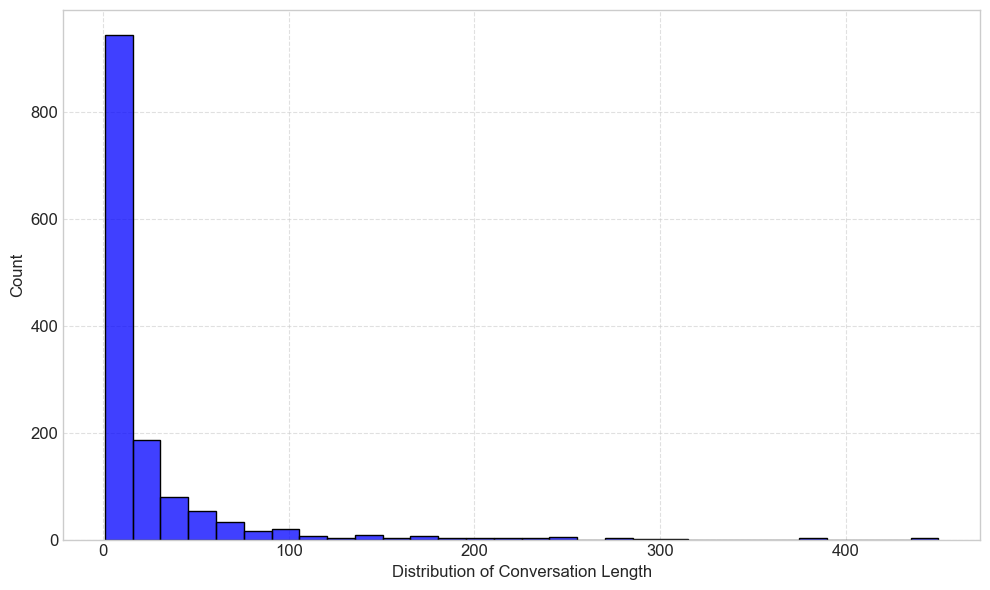

In [83]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Sample Data Preparation (Replace this with your actual dataset)
# Assuming df_stats['comments'] exists and contains numerical data
# df_stats = pd.DataFrame({'comments': [...]})

# Set style for professional appearance
sns.set_style('whitegrid')  

# Set plot size for better visibility in publications
plt.figure(figsize=(10, 6))

# Plot histogram using seaborn for better aesthetics
sns.histplot(df_stats['comments'], bins=30, kde=False, color='blue', edgecolor='black')

# Customize the plot with titles and labels
#plt.title('Length of Conversation', fontsize=12, weight='bold')
plt.xlabel('Distribution of Conversation Length', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Customize ticks for readability
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Adding gridlines for better readability
plt.grid(visible=True, linestyle='--', alpha=0.6)

# Save plot in high resolution for research papers
plt.tight_layout()
plt.savefig('conv_length_histogram.pdf', format='pdf', dpi=300)  # Save as vector graphic for LaTeX use

# Show the plot
plt.show()


## Data analysis of train/val/test datasets CAD

In [2]:
train_file, val_file, test_file = "../../data/cad_train_dump.jsonl", "../../data/cad_validation_dump.jsonl", "../../data/cad_test_dump.jsonl"

In [3]:
train_df = pd.read_json(train_file, lines=True)
val_df = pd.read_json(val_file, lines=True)
test_df = pd.read_json(test_file, lines=True)

In [4]:
train_df.head()

,true_binary_label,index_in_conv,length_conv,author,body,controversiality,subreddit,label,score,parent_id,...,edited,post_created_utc,post_id,post_score,post_parent_id,post_num_comments,post_title,post_url,post_body,post_selftext
0,1,27,50,_Blurryface_21,converting to jizzlam brb,0,bakchodi,IdentityDirectedAbuse,15,emq18i4,...,0,1557216598,blo191,311,,48,Quint being a limp dick as always...,https://i.redd.it/2u5g507xyqw21.jpg,,
1,0,19,29,ALameExcuse,*Oh*,0,TumblrInAction,Neutral,1,eft83l2,...,0,1549384622,anfuxw,79,,27,No jacket = misogynist,https://i.redd.it/75bt60fq2oe21.jpg,,
2,1,192,383,Wopitikitotengo,This 100%. more people need to know about the ...,0,Drama,IdentityDirectedAbuse,35,ekyf7b3,...,0,1555345760,bdi2c1,547,,366,the NYT finally breaks the bad news that most ...,https://www.reddit.com/r/politics/comments/bdc...,,
3,1,0,45,AintABot,,-1,TumblrInAction,IdentityDirectedAbuse,1074,,...,0,1557222054,bloogk,1074,,43,men are trash (terms and conditions applied),https://i.redd.it/t5wgpy35frw21.jpg,,
4,0,1,16,zettaikareshi,This is why I don't talk about my illness with...,0,TrueOffMyChest,Neutral,2,b6d8m7,...,0,1553739690,b6d8m7,9,,15,No one wants to date the “sick girl”,https://www.reddit.com/r/TrueOffMyChest/commen...,,No one wants to date the “sick girl.”\n\nAnd I...


In [5]:
train_df['count'] = 1
val_df['count'] = 1
test_df['count'] = 1

In [6]:
total_train, total_val, total_test = train_df['count'].sum(), val_df['count'].sum(), test_df['count'].sum()
print(f"There are {total_train} samples in the CAD training set, {total_val} samples in the val set and {total_test} in the test set")

There are 5768 samples in the CAD training set, 721 samples in the val set and 721 in the test set


### Label distribution 

In [7]:
train_df.groupby('true_binary_label')['count'].sum()

true_binary_label
0    2880
1    2888
Name: count, dtype: int64

In [8]:
train_df.groupby('label')['count'].sum() * 100 / total_train 

label
AffiliationDirectedAbuse    13.349515
CounterSpeech                0.398752
IdentityDirectedAbuse       26.317614
Neutral                     49.289182
PersonDirectedAbuse         10.402219
Slur                         0.242718
Name: count, dtype: float64

In [9]:
test_df.groupby('true_binary_label')['count'].sum()

true_binary_label
0    371
1    350
Name: count, dtype: int64

In [10]:
test_df.groupby('label')['count'].sum() * 100 / total_test

label
AffiliationDirectedAbuse    12.621359
CounterSpeech                0.416089
IdentityDirectedAbuse       24.965326
Neutral                     50.762829
PersonDirectedAbuse         10.957004
Slur                         0.277393
Name: count, dtype: float64

In [11]:
val_df.groupby('true_binary_label')['count'].sum()

true_binary_label
0    354
1    367
Name: count, dtype: int64

In [12]:
val_df.groupby('label')['count'].sum() * 100 / total_val

label
AffiliationDirectedAbuse    11.373093
CounterSpeech                0.416089
IdentityDirectedAbuse       26.768377
Neutral                     48.543689
PersonDirectedAbuse         12.760055
Slur                         0.138696
Name: count, dtype: float64

## Printing some examples 

In [13]:
print('Examples of PersonDirectedAbuse')
print('________________________________________________________________\n')

pda = train_df[train_df['label'] == 'PersonDirectedAbuse']
for i, text in enumerate(pda['body']):
    if i > 91:
        print(text + '\n')
    if i > 101:
        break


Examples of PersonDirectedAbuse
________________________________________________________________

even in the public eye he's an absolute stooge. 

dude drinks millions of dollars of wine a year, got roundhoused by a woman and he doesn't expect the vast majority of us to want to stomp on his tiny head? 

thank mr oranj

Im a g-slur mom and ally - he really did care about the G community. Joe was just plain fucking crazy. 

Trump works on the level of emotional truths not external facts.  Emotions like anxiety, fear, xenophobia, anger are very primitive, they go back to long before we were even human.  Mostly before we were primates, I'd guess.  
The "logic" used by emotions is largely association, and Trump is very skilled at that type of logic.         

Try not using "post-truth" as a smug insult and excuse for inaction outside your own circle, but as a realistic description of the world you live in.   Maybe you can think of ways to make that world better.

Fuck that guy

WHAT THE FU

In [14]:
print('Examples of AffiliationDirectedAbuse')
print('________________________________________________________________\n')

ada = train_df[train_df['label'] == 'AffiliationDirectedAbuse']
for i, text in enumerate(ada['body']):
    print(text + '\n')
    if i > 15:
        break


Examples of AffiliationDirectedAbuse
________________________________________________________________

Tbh, I find Dr. Lobsterson takes so innocuous and unoriginal, that the amount of shit he gets from chapos baffles me, but it's so obvious that he is intentionally milking these dysfunctional, slothful manchildren. 

The Sandy Hook school building is identical to Quetzalcoatl's Temple, where they sacrificed children to the gods. It's a straight up copy paste. 

Yikes sweaty, working class means you flew your anarcho-communism flag on daddy's yacht.

>  I would imagine there's not a ton of liberal incels. 

Incels are just involuntarily celibate how does that relate to politics?  I can picture a fat socially awkward Bernie fan pretty easily.  


 It's sad that "Nazi" is just degrading into an insult.

But they don't "punch" with those wet noodle arms - they hit old men with bike locks and crow bars. 

The only "punching" I've seen is Proud boys knocking those creampuffs out.

Remember t

In [15]:
print('Examples of IdentityDirectedAbuse')
print('________________________________________________________________\n')

ada = train_df[train_df['label'] == 'IdentityDirectedAbuse']
for i, text in enumerate(ada['body']):
    print(text + '\n')
    if i > 15:
        break


Examples of IdentityDirectedAbuse
________________________________________________________________

converting to jizzlam brb

This 100%. more people need to know about the effects of having a completely external locus of control and its impact on retards on the Internet.

I've seen people essentially arguing that having an external locus of control is the only way to be woke, it's insane.



We all know when they are friends. You seriously think staunch Zionist abrahmics can be friends with us pagans Hindu apart from the agenda they have in their mind ? Jews and their abrahmic religions (Christianity Islam Judaism ) hate us just like they hated pagan Europeans.

How to make a gender neautral bathroom in the sims:

1. Make a bathroom

2. Put a door on it that isn't one of the two men/women only toilet doors

We don't need a whole new door for it.

Besides, EA wil, probably make it paid-for.

So if inbreeding preserves that southern rednecks are the master race?

Didn't even have to go 

In [16]:
print('Examples of Neutral')
print('________________________________________________________________\n')

ada = train_df[train_df['label'] == 'Neutral']
for i, text in enumerate(ada['body']):
    print(text + '\n')
    if i > 15:
        break


Examples of Neutral
________________________________________________________________

*Oh*

This is why I don't talk about my illness with partners. It's rarely discussed. 

The meme is correct. If you don’t drink the misandrist kool-aid, she is not for you. She did you a favor!

M A U L A N A   M O D I


As a Spaniard I’d be really, really happy if Cervantesboos are ever taken down the notch they need. It’s time to stop forcing children to read and *like* the novel, and it’s time to stop proclaiming Cervantes the greatest Spanish writer when there’s Benito Pérez Galdós, and Lope and Quevedo in the Golden Century.

We’re on a highway to hell...



What are the United States striving to achieve through their envoy in Lebanon Mr. David Satterfield and his ilk? The USA are very strong to exploit all things, and exploit all situations in an evil way (in their interests and to our detriment). Since Lebanon needs a rapid delineation of borders, especially at sea, to be able to exploit oil an

In [17]:
print('Examples of CounterSpeech')
print('________________________________________________________________\n')

ada = train_df[train_df['label'] == 'CounterSpeech']
for i, text in enumerate(ada['body']):
    print(text + '\n')
    if i > 15:
        break


Examples of CounterSpeech
________________________________________________________________

Go suck an egg. This isn't about race.

It wasn't specified to by Gender Dysphoria. It was just described that you can't be trans without Dysphoria (a state of unease or generalized dissatisfaction with life.) and that's too much of a general statement to be factually true.

In reference to Genders? Unknown. As Gender is a psychological way of thinking there is theoretically countless Genders.

In reference to Biological Sex? a confirmed minimum of 4.
As Sex is a Physical characteristic, at the moment we can confirm 4 different Sex characteristics (Penis, Vagina, Both P & V or Neither) but this could change in the future.

With all of this Gender/Sex/Sexuality discussions we need to remember that it's a change field of research and if my years of Sexology education and research has told me anything, it's that everything we know is changing and we're finding out more and more about Human sexualit

In [18]:
print('Examples of Non Harmful Slurs')
print('________________________________________________________________\n')

ada = train_df[train_df['label'] == 'Slur']
for i, text in enumerate(ada['body']):
    print(text + '\n')
    if i > 15:
        break


Examples of Non Harmful Slurs
________________________________________________________________

> If a man approaches me on the street, and I've got visible headphones in, and I don't react at all, he assumes I can't hear him.

Idk even still I get the "WHAT A FUCKING BITCH YOU CUNT" because I didn't grace them with my attention 

You just don’t get it! They’re laughing WITH black people when they call them the N word! Not at them!

Jeez, You’d have to be a racist neo-nazi troll to think that r/blackpeopletwitter using the N word in every instance they refer to black people as racism!

It doesn’t matter. Friends only keep the ones that benefit them. It seems better than ‘bitches,’ until you realize that everyone is using you. Is that dark enough for this sub?

Where does it say that? I thought it was a place to bitch about why you feel reddit is going or has gone to shit

Let me tell you this-- /r/Drama is one of the most malevolent, cruel, coldhearted online communities you'll ever fi

### Conversation analysis

In [19]:
print(f"There are {train_df['post_id'].nunique()} unique conversations in the CAD training set, {val_df['post_id'].nunique()} unique conversations in the val set and {test_df['post_id'].nunique()} in the test set")

There are 1003 unique conversations in the CAD training set, 389 unique conversations in the val set and 379 in the test set


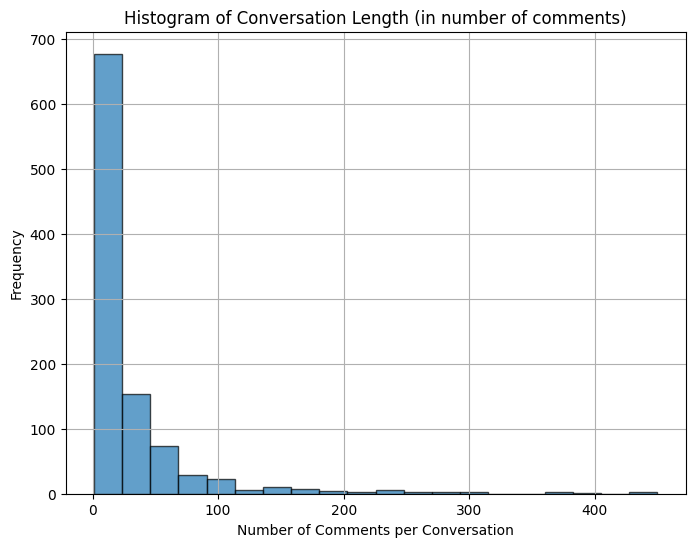

In [20]:
grouped_data = train_df.groupby('post_id')['length_conv'].max()
# Plotting the histogram
plt.figure(figsize=(8, 6))
plt.hist(grouped_data, bins=20, edgecolor='black', alpha=0.7)
plt.title('Histogram of Conversation Length (in number of comments)')
plt.xlabel('Number of Comments per Conversation')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()



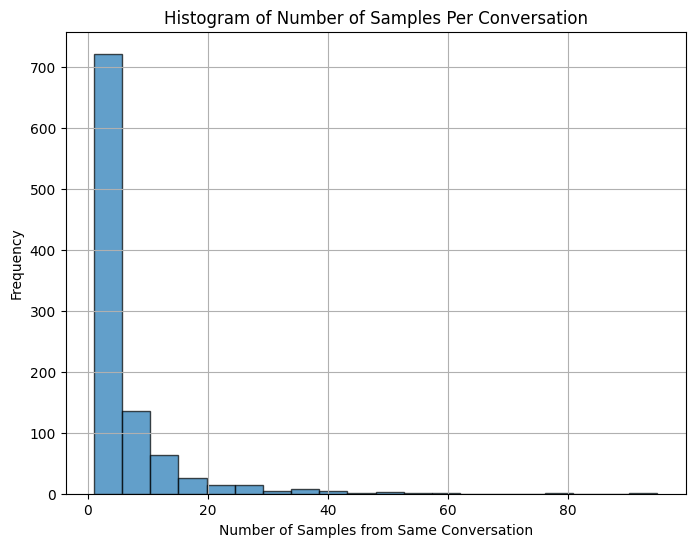

In [21]:
grouped_data = train_df.groupby('post_id')['count'].sum()
# Plotting the histogram
plt.figure(figsize=(8, 6))
plt.hist(grouped_data, bins=20, edgecolor='black', alpha=0.7)
plt.title('Histogram of Number of Samples Per Conversation')
plt.xlabel('Number of Samples from Same Conversation')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

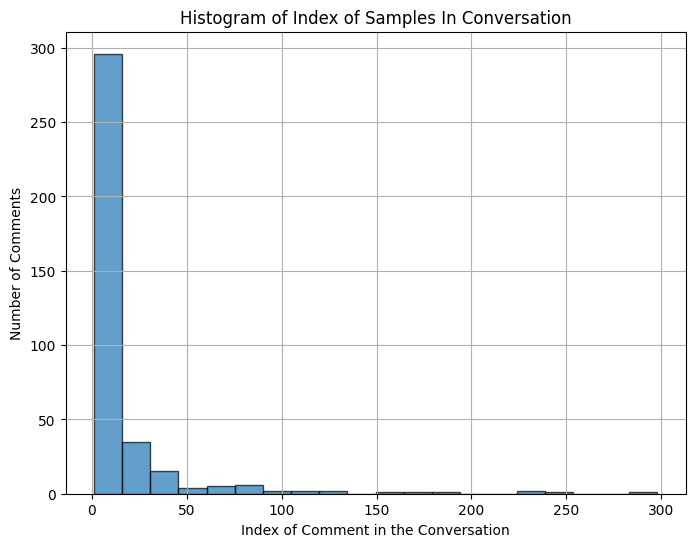

In [22]:
grouped_data = train_df.groupby('index_in_conv')['count'].sum()
# Plotting the histogram
plt.figure(figsize=(8, 6))
plt.hist(grouped_data, bins=20, edgecolor='black', alpha=0.7)
plt.title('Histogram of Index of Samples In Conversation')
plt.xlabel('Index of Comment in the Conversation')
plt.ylabel('Number of Comments')
plt.grid(True)
plt.show()




### Feature Analysis 

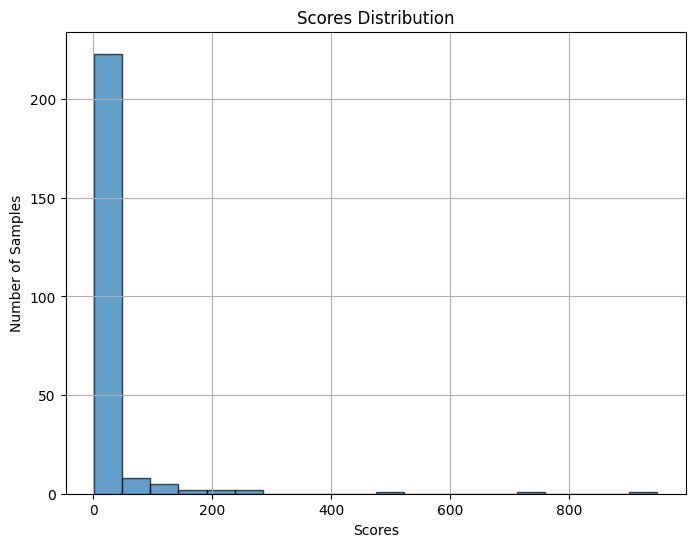

In [23]:
grouped_data = train_df.groupby('score')['count'].sum()
# Plotting the histogram
plt.figure(figsize=(8, 6))
plt.hist(grouped_data, bins=20, edgecolor='black', alpha=0.7)
plt.title('Scores Distribution')
plt.xlabel('Scores')
plt.ylabel('Number of Samples')
plt.grid(True)
plt.show()



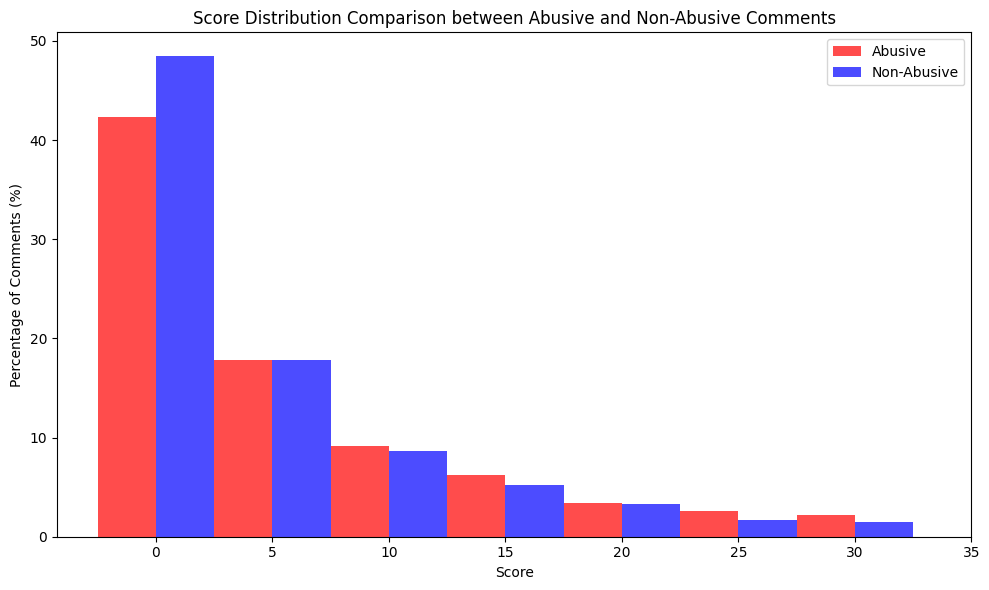

In [28]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Separate the data based on labels
abusive_scores = train_df[train_df['true_binary_label'] == 1]['score']
non_abusive_scores = train_df[train_df['true_binary_label'] == 0]['score']

# Define bins for histogram
bins = np.arange(0, np.mean(train_df['score']) + 20, 5)  # Adjust bin size as needed

# Calculate the percentages for each bin
hateful_counts, _ = np.histogram(abusive_scores, bins=bins)
non_hateful_counts, _ = np.histogram(non_abusive_scores, bins=bins)

# Normalize to get the percentage of comments in each bin
hateful_percentages = 100 * hateful_counts / len(abusive_scores)
non_hateful_percentages = 100 * non_hateful_counts / len(non_abusive_scores)

# Plotting the side-by-side histograms
bin_width = bins[1] - bins[0]
plt.figure(figsize=(10, 6))

# Plot hateful comments
plt.bar(bins[:-1] - bin_width/4, hateful_percentages, width=bin_width/2, color='red', alpha=0.7, label='Abusive')

# Plot non-hateful comments
plt.bar(bins[:-1] + bin_width/4, non_hateful_percentages, width=bin_width/2, color='blue', alpha=0.7, label='Non-Abusive')

# Add labels and title
plt.xlabel('Score')
plt.ylabel('Percentage of Comments (%)')
plt.title('Score Distribution Comparison between Abusive and Non-Abusive Comments')
plt.xticks(bins)
plt.legend()

# Show plot
plt.tight_layout()
plt.show()

In [25]:
train_df.groupby('true_binary_label')['score'].mean()


true_binary_label
0    20.378125
1    15.911704
Name: score, dtype: float64

In [26]:
train_df.groupby('true_binary_label')['score'].median()


true_binary_label
0    4.0
1    5.0
Name: score, dtype: float64

In [50]:
counts = train_df.groupby(['true_binary_label', 'controversiality']).size().unstack(fill_value=0)
counts

controversiality,-1,0,1
true_binary_label,,,
0,142,2654,84
1,108,2654,126


In [51]:
grouped_df = train_df.groupby('author')['true_binary_label'].sum().reset_index()
sorted_df = grouped_df.sort_values(by='true_binary_label', ascending=False)


sorted_df.head()

,author,true_binary_label
2428,[deleted],90
1624,PlanetuneJeb,20
477,CondensedBemusement,12
3403,oppaishorty,11
3899,watermark002,10


In [52]:
train_df['text_length'] = train_df['body'].apply(len)

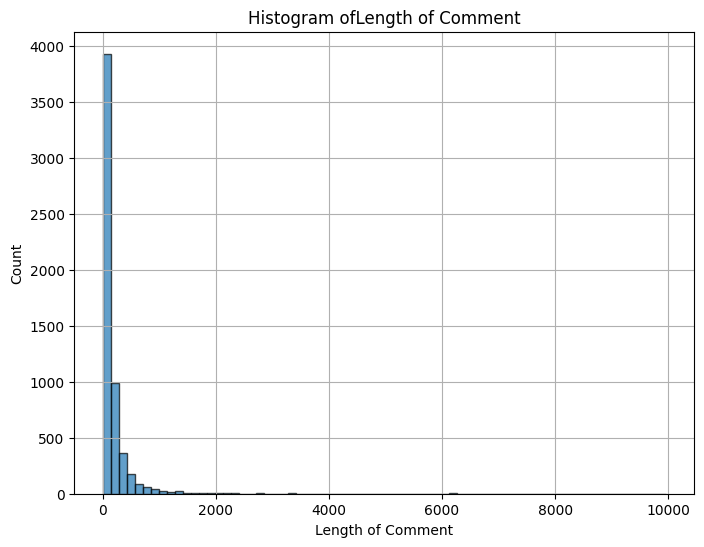

In [53]:


# Plotting the histogram
plt.figure(figsize=(8, 6))
plt.hist(train_df['text_length'], bins=70, edgecolor='black', alpha=0.7)
plt.title('Histogram ofLength of Comment')
plt.xlabel('Length of Comment')
plt.ylabel('Count')
plt.grid(True)
plt.show()

In [54]:
train_df['text_length'].mean()

168.7252080443828

In [55]:
train_df['text_length'].median()

85.0

In [57]:
train_df['text_length'].max()

9965